## **🏦 Bank Loan Portfolio Project** - Classification Project

In [2]:
# Importing necessary libraries

import pandas as pd     # for data cleaning, filtering and manipulation
import numpy as np           # numpy used for numerical computing
import seaborn as sns           # for advance and beautiful visualizations
import matplotlib.pyplot as plt     # for creating visualizations
%matplotlib inline 
from ydata_profiling import ProfileReport     # for generating profile report     
import plotly.express as px         # interactive and web based plotting library in python
import warnings                 # for supressing warning messages during code execution
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)

#### **Necessary Libraries**
- **Pandas** - Pandas is used for data analysis and handling tabular data like Excel.
It provides easy tools to load, clean, and explore data using DataFrames.
- **Numpy** - NumPy is a Python library used for fast mathematical and array operations.
It helps in working with large datasets using arrays, matrices, and functions.
- **Seaborn** - Seaborn is a Python library for making beautiful and simple statistical charts.
It is built on top of Matplotlib and works well with Pandas.
- **Matplotlib** - Matplotlib is used to create basic graphs like line, bar, and pie charts.
It helps in visualizing data in static and simple formats.
- **Plotly** - Plotly is a library for creating interactive and web-based charts.
It is used when you want zoomable and clickable graphs.
- **%matplotlib inline** - This is used in Jupyter Notebook to show plots right below your code cell.
It helps display Matplotlib charts inside the notebook.
warnings (import warnings)
- **import warnings** - import warnings is used to manage or ignore warning messages in Python.
It helps keep output clean and readable during code execution.
- **ydata_profiling** - ydata_profiling quickly creates an automatic EDA report from your data.
It gives summaries, graphs, and insights in one HTML file.

In [4]:
# Loading dataaset using .read_csv() method of pandas

df = pd.read_csv("C:\\Users\\HP\\OneDrive\\Documents\\Bank_Loan_Portfolio.csv")

In [5]:
# Displaying first five records from the dataframe

df.head()

,Loan_ID,Application_Date,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category
0,LN102453,2023-08-13,Mumbai,West,43,Self-Employed,90322.0,980052.0,84,10.92,672.0,0.185,Approved,0,Active,4.1,Medium
1,LN100671,2024-11-26,Hyderabad,South,28,Salaried,32617.0,488350.0,54,9.99,698.0,0.345,Approved,0,Paid,4.6,Medium
2,LN100884,2024-03-07,Mumbai,West,34,Business,86468.0,NaN,53,11.56,709.0,0.422,Rejected,0,Rejected,4.4,Medium
3,LN100618,2023-04-07,Mumbai,West,33,Self-Employed,110760.0,1298938.0,59,8.36,730.0,0.243,Approved,0,Active,5.0,Low
4,LN100344,2023-05-30,Mumbai,West,37,Salaried,141338.0,1627058.0,110,10.14,767.0,0.161,Approved,0,Active,4.5,Low


In [6]:
# Displaying last five records from the dataframe

df.head()

,Loan_ID,Application_Date,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category
0,LN102453,2023-08-13,Mumbai,West,43,Self-Employed,90322.0,980052.0,84,10.92,672.0,0.185,Approved,0,Active,4.1,Medium
1,LN100671,2024-11-26,Hyderabad,South,28,Salaried,32617.0,488350.0,54,9.99,698.0,0.345,Approved,0,Paid,4.6,Medium
2,LN100884,2024-03-07,Mumbai,West,34,Business,86468.0,NaN,53,11.56,709.0,0.422,Rejected,0,Rejected,4.4,Medium
3,LN100618,2023-04-07,Mumbai,West,33,Self-Employed,110760.0,1298938.0,59,8.36,730.0,0.243,Approved,0,Active,5.0,Low
4,LN100344,2023-05-30,Mumbai,West,37,Salaried,141338.0,1627058.0,110,10.14,767.0,0.161,Approved,0,Active,4.5,Low


In [7]:
# Displaying 5 random sample records from the dataframe

df.sample(5)

,Loan_ID,Application_Date,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category
1322,LN100562,2023-06-14,Pune,West,39,Salaried,29464.0,100000.0,63,12.11,575.0,0.073,Rejected,0,Rejected,5.0,High
1945,LN101251,2024-04-12,Chennai,South,47,Business,111636.0,962367.0,113,11.77,696.0,0.127,Approved,0,Paid,4.4,Medium
501,LN102447,2024-08-04,Bengaluru,South,35,Self-Employed,127933.0,1208173.0,12,10.77,695.0,0.834,Rejected,0,Rejected,5.0,High
996,LN102662,2023-04-04,Bengaluru,South,21,Business,62103.0,1128471.0,74,11.58,847.0,0.345,Approved,0,Paid,5.0,Low
2603,LN101054,2023-06-17,Hyderabad,South,31,NaN,103777.0,1513984.0,98,10.86,653.0,0.225,Rejected,0,rejected,4.8,Medium


In [8]:
# Getting the list of column names from the dataframe 

column_names_list = df.columns.tolist()
print(column_names_list)

['Loan_ID', 'Application_Date', 'City', 'Region', 'Age', 'Employment_Type', 'Income', 'Loan_Amount', 'Loan_Tenure_Months', 'Interest_Rate_Percent', 'Credit_Score', 'Debt_To_Income_Ratio', 'Approval_Status', 'Default_Flag', 'Loan_Status', 'Customer_Rating', 'Risk_Category']


### **Column Description**
- **`Loan_ID`** - Unique loan identifier.
- **`Application_Date`** - Date of application (YYYY-MM-DD).
- **`City`** - Applicant city (6-city set).
- **`Region`** - Geographic region derived from city.
- **`Age`** - Applicant age.
- **`Employment_Type`** - Salaried | Self-Employed | Business.
- **`Income (INR)`** - Monthly income.
- **`Loan_Amount (INR)`** - Approved amount; correlated with Income and purpose.
- **`Loan_Tenure_Months`** - Tenure in months.
- **`Interest_Rate_Percent`** - Annual interest rate (%).
- **`Credit_Score (300–900)`** - Higher is better.
- **`Debt_To_Income_Ratio`** - EMI / Income.
- **`Approval_Status`** - Approved | Rejected.
- **`Default_Flag`** - 1 if defaulted (only meaningful when approved)(Applicant repay or missed payments).
- **`Loan_Status`** - Active | Paid | Defaulted | Rejected.
- **`Customer_Rating (1–5)`** - Internal score.
- **`Risk_Category`** - Low | Medium | High.

In [10]:
# Checking shape of the dataframe

df.shape

(3000, 17)

**Dataset has 3000 records with 17 columns.**

In [12]:
# Generating profile report before cleaning the dataset

Profile = ProfileReport(df)
Profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 17/17 [00:00<00:00, 36.82it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
# Checking datatypes of all columns in the dataframe

df.dtypes

Loan_ID                   object
Application_Date          object
City                      object
Region                    object
Age                        int64
Employment_Type           object
Income                   float64
Loan_Amount              float64
Loan_Tenure_Months         int64
Interest_Rate_Percent    float64
Credit_Score             float64
Debt_To_Income_Ratio     float64
Approval_Status           object
Default_Flag               int64
Loan_Status               object
Customer_Rating          float64
Risk_Category             object
dtype: object

In [14]:
# Converting datatype of Application_Date from object to datetime

df['Application_Date'] = pd.to_datetime(df['Application_Date'])

In [15]:
# Extracting columns from the Application_Date column

# Creating new features Year, Month, Day, Weekday, Weekend from 'Date' feature

df['Year'] = df['Application_Date'].dt.year       # year from the date
df['Month'] = df['Application_Date'].dt.month          # month from the date
df['Day'] = df['Application_Date'].dt.day          # day number from the date
df['Weekday'] = df['Application_Date'].dt.day_name()          # weekday from the date
df['IsWeekend'] = df['Weekday'].isin(['Saturday', 'Sunday']).astype(int)     # isweekend or not(yes or no)

In [16]:
# Dropping Loan_ID because we will not use it in analysis 
df.drop(columns=['Loan_ID'], axis=1, inplace=True)

# Dropping Application_Date column because we had extracted new features from it
df.drop(columns=['Application_Date'], axis=1, inplace=True)

In [17]:
# Here in column Default_Flag and IsWeekend values are 0 and 1 we convert them to yes and no

df['Default_Flag'] = df['Default_Flag'].replace(0, 'No')
df['Default_Flag'] = df['Default_Flag'].replace(1, 'Yes')
df['IsWeekend'] = df['IsWeekend'].replace(0, 'No')
df['IsWeekend'] = df['IsWeekend'].replace(1, 'Yes')

In [18]:
# Checking unique values in each categorical column

# Creating list of categorical columns
cat_col = []
for col in df.columns:
    if df[col].dtype == 'object':
        cat_col.append(col)

for i, column in enumerate(cat_col, start=1):
    print(f'{i}. Unique values in {column} are {df[column].unique()}.\n')

1. Unique values in City are ['Mumbai' 'Hyderabad' 'Chennai' 'delhi' 'Delhi' 'Pune' 'Bengaluru'
 'mumbai' 'hyderabad' 'pune' 'chennai' 'bengaluru'].

2. Unique values in Region are ['West' 'South' 'North'].

3. Unique values in Employment_Type are ['Self-Employed' 'Salaried' 'Business' 'salaried' nan 'business'
 'self-employed'].

4. Unique values in Approval_Status are ['Approved' 'Rejected' 'approved' 'rejected'].

5. Unique values in Default_Flag are ['No' 'Yes'].

6. Unique values in Loan_Status are ['Active' 'Paid' 'Rejected' 'rejected' 'Defaulted' 'paid' 'active'
 'defaulted'].

7. Unique values in Risk_Category are ['Medium' 'Low' 'high' 'High' 'low' 'medium'].

8. Unique values in Weekday are ['Sunday' 'Tuesday' 'Thursday' 'Friday' 'Monday' 'Saturday' 'Wednesday'].

9. Unique values in IsWeekend are ['Yes' 'No'].



In [19]:
# In this dataset same categories in some categorical feature are in titlecase as well as lowercase, so here we convert those lowercase categories to titlecase

df['City'] = df['City'].str.title()
df['Employment_Type'] = df['Employment_Type'].str.title()
df['Approval_Status'] = df['Approval_Status'].str.title()
df['Loan_Status'] = df['Loan_Status'].str.title()
df['Risk_Category'] = df['Risk_Category'].str.title()

In [20]:
# Checking unique values in each categorical column after changing them in titlecase

for i, column in enumerate(cat_col, start=1):
    print(f'{i}. Unique values in {column} are {df[column].unique()}.\n')

1. Unique values in City are ['Mumbai' 'Hyderabad' 'Chennai' 'Delhi' 'Pune' 'Bengaluru'].

2. Unique values in Region are ['West' 'South' 'North'].

3. Unique values in Employment_Type are ['Self-Employed' 'Salaried' 'Business' nan].

4. Unique values in Approval_Status are ['Approved' 'Rejected'].

5. Unique values in Default_Flag are ['No' 'Yes'].

6. Unique values in Loan_Status are ['Active' 'Paid' 'Rejected' 'Defaulted'].

7. Unique values in Risk_Category are ['Medium' 'Low' 'High'].

8. Unique values in Weekday are ['Sunday' 'Tuesday' 'Thursday' 'Friday' 'Monday' 'Saturday' 'Wednesday'].

9. Unique values in IsWeekend are ['Yes' 'No'].



In [21]:
# Checking value_counts() for each categorical column

for i, column in enumerate(cat_col, start=1):
    print(f'{i}. Value counts in {df[column].value_counts()}.\n')

1. Value counts in City
Delhi        538
Mumbai       510
Chennai      504
Pune         497
Bengaluru    486
Hyderabad    465
Name: count, dtype: int64.

2. Value counts in Region
South    1455
West     1007
North     538
Name: count, dtype: int64.

3. Value counts in Employment_Type
Salaried         1682
Self-Employed     612
Business          586
Name: count, dtype: int64.

4. Value counts in Approval_Status
Approved    2008
Rejected     992
Name: count, dtype: int64.

5. Value counts in Default_Flag
No     2794
Yes     206
Name: count, dtype: int64.

6. Value counts in Loan_Status
Active       1094
Rejected      992
Paid          708
Defaulted     206
Name: count, dtype: int64.

7. Value counts in Risk_Category
Medium    1370
Low        953
High       677
Name: count, dtype: int64.

8. Value counts in Weekday
Monday       458
Thursday     452
Tuesday      441
Sunday       430
Friday       421
Saturday     407
Wednesday    391
Name: count, dtype: int64.

9. Value counts in IsWeekend


In [22]:
# Checking total number of missing values present in the dataset

df.isnull().sum()

City                       0
Region                     0
Age                        0
Employment_Type          120
Income                   120
Loan_Amount              121
Loan_Tenure_Months         0
Interest_Rate_Percent      0
Credit_Score             121
Debt_To_Income_Ratio       0
Approval_Status            0
Default_Flag               0
Loan_Status                0
Customer_Rating            0
Risk_Category              0
Year                       0
Month                      0
Day                        0
Weekday                    0
IsWeekend                  0
dtype: int64

**Dataset has 120 missing values in Employment_Type and Income, 121 missing values in Loan_Amount and Credit_Score.**

In [24]:
# Records with missing values in Income column

df[df['Income'].isna()]

,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category,Year,Month,Day,Weekday,IsWeekend
28,Bengaluru,South,35,Business,NaN,1093595.0,76,8.93,667.0,0.207,Approved,No,Active,4.4,Medium,2023,5,15,Monday,No
32,Bengaluru,South,43,Salaried,NaN,NaN,89,12.36,676.0,0.088,Rejected,No,Rejected,4.3,Medium,2023,12,14,Thursday,No
59,Delhi,North,21,Self-Employed,NaN,1110054.0,85,9.92,672.0,0.221,Approved,Yes,Defaulted,1.5,Medium,2023,8,27,Sunday,Yes
127,Delhi,North,31,Business,NaN,396578.0,74,12.37,670.0,0.106,Approved,No,Active,4.1,Medium,2023,8,1,Tuesday,No
128,Bengaluru,South,43,Self-Employed,NaN,1171502.0,94,13.64,706.0,0.211,Rejected,No,Rejected,5.0,Medium,2024,6,29,Saturday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2762,Hyderabad,South,37,Business,NaN,1087052.0,91,12.44,717.0,0.161,Approved,No,Active,4.6,Medium,2023,2,8,Wednesday,No
2854,Chennai,South,44,Salaried,NaN,1277157.0,85,10.98,808.0,0.178,Approved,No,Active,4.8,Low,2024,2,14,Wednesday,No
2864,Delhi,North,41,Business,NaN,698372.0,91,10.17,NaN,0.095,Rejected,No,Rejected,4.7,Low,2023,3,31,Friday,No
2866,Hyderabad,South,32,Business,NaN,1164808.0,74,10.94,669.0,0.208,Rejected,No,Rejected,4.1,Medium,2023,7,2,Sunday,Yes


In [25]:
# Filling missing value of column Income with median

df['Income'] = df['Income'].fillna(df['Income'].median())

In [26]:
# We have 121 missing values in Credit_Score and these are Missing at Random(MAR) type of missing values because missing credit score is depend on risk category column in the dataset
# So we fill this missing values with median(because dataset has outliers) of that particular category using groupby and fillna

df['Credit_Score'] = df['Credit_Score'].fillna(df['Risk_Category'].map(df.groupby('Risk_Category')['Credit_Score'].median()))

In [27]:
# Same for Loan amount it has missing values and Loan amount column is highly correlated with Income column in the dataset
# This are also Missing at Random(MAR) type of missing values

# Creating new column income category, so that we can identify in which category applicant's income belongs
# .qcut() method divides data into equal sized bins, it automatically sort data in ascending order and then divides the data
df['Income_Category'] = pd.qcut(df['Income'], 4, labels = ['Low','Medium','High','Very High']) 

# Filling missing values with median of column Loan_Amount
df['Loan_Amount'] = df['Loan_Amount'].fillna(df.groupby('Income_Category')['Loan_Amount'].transform('median'))

In [28]:
# Missing values in Employment_Type column are of Missing Completely at Random(MCAR) type because it is just data entry mistake
# Here we are filling with most frequent value of that column(mode)

df['Employment_Type'].fillna(df['Employment_Type'].mode()[0], inplace=True)

In [29]:
# Checking missing values after handling

df.isnull().sum()

City                     0
Region                   0
Age                      0
Employment_Type          0
Income                   0
Loan_Amount              0
Loan_Tenure_Months       0
Interest_Rate_Percent    0
Credit_Score             0
Debt_To_Income_Ratio     0
Approval_Status          0
Default_Flag             0
Loan_Status              0
Customer_Rating          0
Risk_Category            0
Year                     0
Month                    0
Day                      0
Weekday                  0
IsWeekend                0
Income_Category          0
dtype: int64

**Now dataset has no missing values in any column.**

In [31]:
# Cheking total number of duplicate records present in the dataset

df.duplicated().sum()

44

In [32]:
# Displaying duplicate records (includes both duplicate records)

duplicate_records = df[df.duplicated(keep=False)]
duplicate_records

,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category,Year,Month,Day,Weekday,IsWeekend,Income_Category
13,Chennai,South,28,Salaried,105710.0,570605.0,43,9.340000,790.0,0.148,Approved,No,Paid,4.5,Low,2024,2,9,Friday,No,Very High
57,Chennai,South,39,Salaried,60401.0,257897.0,66,11.520000,786.0,0.088,Approved,No,Active,5.0,Low,2024,5,5,Sunday,Yes,Low
102,Chennai,South,42,Salaried,75214.0,476919.0,69,9.370000,737.0,0.119,Approved,No,Active,5.0,Low,2024,6,15,Saturday,Yes,Medium
132,Chennai,South,42,Business,44307.0,489558.0,78,40.447347,623.0,0.204,Rejected,No,Rejected,4.8,High,2023,12,6,Wednesday,No,Low
183,Hyderabad,South,37,Business,90066.0,629868.0,107,10.320000,688.0,0.100,Rejected,No,Rejected,4.1,Medium,2023,9,25,Monday,No,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2773,Pune,West,39,Business,67690.0,1176702.0,91,10.920000,702.0,0.282,Rejected,No,Rejected,5.0,Medium,2024,5,5,Sunday,Yes,Medium
2822,Bengaluru,South,27,Self-Employed,100613.0,861637.0,88,13.000000,686.0,0.151,Rejected,No,Rejected,3.6,Medium,2023,12,30,Saturday,Yes,High
2834,Chennai,South,28,Salaried,105710.0,570605.0,43,9.340000,790.0,0.148,Approved,No,Paid,4.5,Low,2024,2,9,Friday,No,Very High
2868,Chennai,South,21,Salaried,88743.0,1162186.0,34,10.910000,753.0,0.450,Rejected,No,Rejected,5.0,Medium,2023,11,19,Sunday,Yes,High


In [33]:
# Displaying first five rows

df.head()

,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category,Year,Month,Day,Weekday,IsWeekend,Income_Category
0,Mumbai,West,43,Self-Employed,90322.0,980052.0,84,10.92,672.0,0.185,Approved,No,Active,4.1,Medium,2023,8,13,Sunday,Yes,High
1,Hyderabad,South,28,Salaried,32617.0,488350.0,54,9.99,698.0,0.345,Approved,No,Paid,4.6,Medium,2024,11,26,Tuesday,No,Low
2,Mumbai,West,34,Business,86468.0,954165.0,53,11.56,709.0,0.422,Rejected,No,Rejected,4.4,Medium,2024,3,7,Thursday,No,High
3,Mumbai,West,33,Self-Employed,110760.0,1298938.0,59,8.36,730.0,0.243,Approved,No,Active,5.0,Low,2023,4,7,Friday,No,Very High
4,Mumbai,West,37,Salaried,141338.0,1627058.0,110,10.14,767.0,0.161,Approved,No,Active,4.5,Low,2023,5,30,Tuesday,No,Very High


In [34]:
# Dropping duplicate records from the dataframe

df.drop_duplicates(keep='first', inplace=True)

In [35]:
# Cheking duplicates after handling them

df.duplicated().sum()

0

**Now no duplicate records in this dataset.**

In [37]:
# Displaying the statistical summary of numerical columns in the dataframe

df.describe()

,Age,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Customer_Rating,Year,Month,Day
count,2956.000000,2956.000000,2.956000e+03,2956.00000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000,2956.000000
mean,34.182003,84537.771820,9.123008e+05,75.10318,11.471198,694.389208,0.213129,4.500372,2023.512855,6.444858,15.769621
std,6.765896,30805.982955,6.864649e+05,21.39927,5.865205,57.037001,0.148252,0.725104,0.499919,3.432206,8.839423
min,21.000000,20000.000000,1.000000e+05,12.00000,7.500000,512.000000,0.050000,1.300000,2023.000000,1.000000,1.000000
25%,29.000000,63520.000000,5.717568e+05,60.00000,9.850000,656.000000,0.142000,4.400000,2023.000000,3.000000,8.000000
50%,34.000000,84513.500000,8.556990e+05,76.00000,10.710000,692.000000,0.186000,4.700000,2024.000000,6.000000,16.000000
75%,39.000000,104887.000000,1.128167e+06,90.00000,11.590000,734.000000,0.245000,5.000000,2024.000000,9.000000,24.000000
max,57.000000,202962.000000,9.126093e+06,141.00000,72.676822,887.000000,2.686703,5.000000,2024.000000,12.000000,31.000000


In [38]:
# Displaying the statistical summary of categorical columns in the dataframe

df.describe(include = [object])

,City,Region,Employment_Type,Approval_Status,Default_Flag,Loan_Status,Risk_Category,Weekday,IsWeekend
count,2956,2956,2956,2956,2956,2956,2956,2956,2956
unique,6,3,3,2,2,4,3,7,2
top,Delhi,South,Salaried,Approved,No,Active,Medium,Thursday,No
freq,533,1429,1773,1978,2753,1077,1348,448,2131


### **Summary of categorical columns -**
##### **`City`**
- It has 6 unique categories.
- Top city category is 'Delhi' with a frequency 533.
##### **`Region`**
- It has 3 unique categories.
- Top category is 'South' with a frequency 1429.
##### **`Employment_Type`**
- It has 3 unique categories.
- Top category is 'Salaried' with a frequency 1773.
##### **`Approval_Status`**
- It has 6 unique categories in 'City' feature.
- Top season category is 'Approved' with a frequency 1978.
##### **`Default_Flag`**
- It has 2 unique categories.
- Top category is 'No' with a frequency 2753.
##### **`Loan_Status`**
- It has 4 unique categories.
- Top category is 'Active' with a frequency 1077.
##### **`Risk_Category`**
- It has 3 unique categories.
- Top category is 'Medium' with a frequency 1348.
##### **`IsWeekend`**
- It has 2 unique categories.
- Top category is 'No' with a frequency 2131.
##### **`Weekday`**
- It has 7 unique categories.
- Top category is 'Thursday' with a frequency 448.

In [40]:
# Checking skewness or shape of the numerical columns in the dataframe

# Creating list of numerical columns
num_cols = []
for col in df.columns:
    if df[col].dtype in ['int64','float64']:
        num_cols.append(col)

for col in num_cols:
    skew = df[col].skew()
    print(f"The skewness of column '{col}' is {round(skew,3)}\n")

The skewness of column 'Age' is 0.152

The skewness of column 'Income' is 0.1

The skewness of column 'Loan_Amount' is 5.252

The skewness of column 'Loan_Tenure_Months' is -0.069

The skewness of column 'Interest_Rate_Percent' is 7.093

The skewness of column 'Credit_Score' is 0.004

The skewness of column 'Debt_To_Income_Ratio' is 5.249

The skewness of column 'Customer_Rating' is -2.472



In [42]:
# Using Interquartile range to check outliers in the columns 

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    if not outliers.empty:
        print(f"Column '{col}' has {len(outliers)} outliers.")
    else:
        print(f"Column '{col}' has no outliers.")

Column 'Age' has 6 outliers.
Column 'Income' has 14 outliers.
Column 'Loan_Amount' has 62 outliers.
Column 'Loan_Tenure_Months' has 5 outliers.
Column 'Interest_Rate_Percent' has 62 outliers.
Column 'Credit_Score' has 19 outliers.
Column 'Debt_To_Income_Ratio' has 149 outliers.
Column 'Customer_Rating' has 210 outliers.


In [43]:
# list of columns with outliers 
outlier_cols = ['Age', 'Income', 'Loan_Amount', 'Loan_Tenure_Months',
            'Interest_Rate_Percent', 'Credit_Score', 'Debt_To_Income_Ratio', 'Customer_Rating']

for col in outlier_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    
    # Capping otliers to lower and upper limit
    # np.where is used for conditional selection and replacing
    df[col] = np.where(df[col] > upper_limit, upper_limit,
              np.where(df[col] < lower_limit, lower_limit, df[col]))
    
    print(f"✅ Capped outliers in column: {col}")

✅ Capped outliers in column: Age
✅ Capped outliers in column: Income
✅ Capped outliers in column: Loan_Amount
✅ Capped outliers in column: Loan_Tenure_Months
✅ Capped outliers in column: Interest_Rate_Percent
✅ Capped outliers in column: Credit_Score
✅ Capped outliers in column: Debt_To_Income_Ratio
✅ Capped outliers in column: Customer_Rating


In [45]:
# Using Interquartile range to check outliers after handling

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    if not outliers.empty:
        print(f"Column '{col}' has {len(outliers)} outliers.")
    else:
        print(f"Column '{col}' has no outliers.")

Column 'Age' has no outliers.
Column 'Income' has no outliers.
Column 'Loan_Amount' has no outliers.
Column 'Loan_Tenure_Months' has no outliers.
Column 'Interest_Rate_Percent' has no outliers.
Column 'Credit_Score' has no outliers.
Column 'Debt_To_Income_Ratio' has no outliers.
Column 'Customer_Rating' has no outliers.


**Now dataset has no outliers in any column.**

In [47]:
# Generating profile report after cleaning the dataset

Profile = ProfileReport(df)
Profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 21/21 [00:00<00:00, 49.42it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

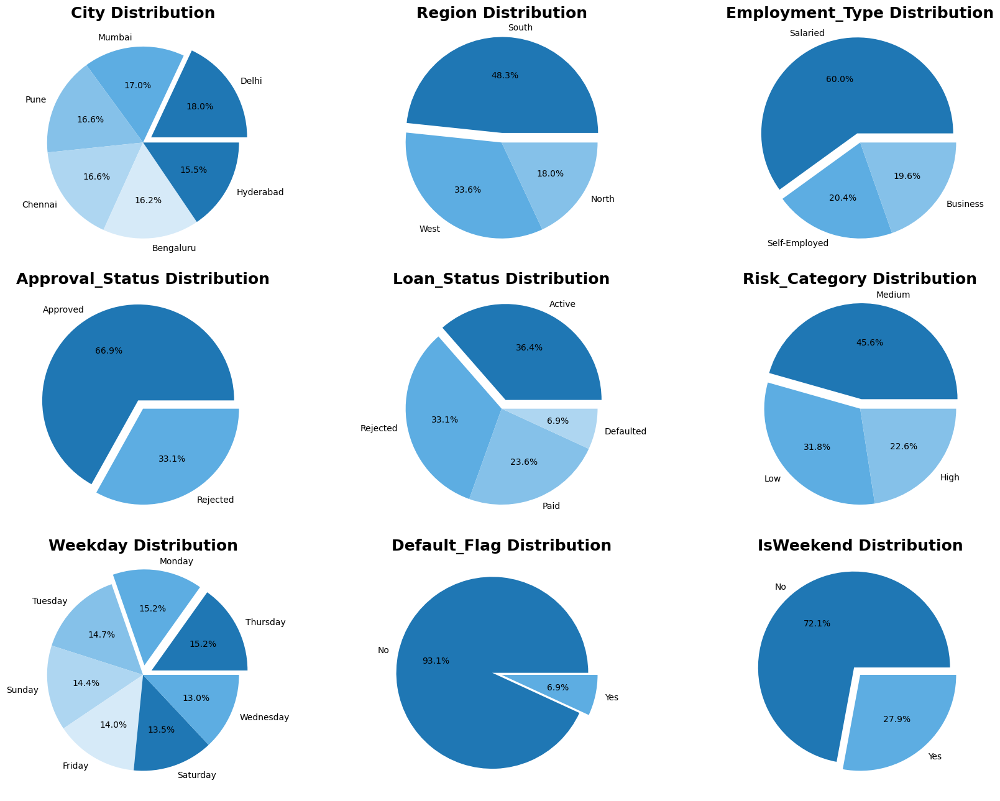

In [48]:
# Displaying pie chart to get distribution of categorical columns

cat_col = ['City',
 'Region',
 'Employment_Type',
 'Approval_Status',
 'Loan_Status',
 'Risk_Category',
 'Weekday', 'Default_Flag','IsWeekend']
# Create subplots: 4 rows, 2 columns
fig, axes = plt.subplots(3,3, figsize=(18, 13))  

# Flatten the 2D axes array to 1D for easy iteration
axes = axes.flatten()

# Defining the color palette
blue_colors = ['#1f77b4', '#5dade2', '#85c1e9', '#aed6f1', '#d6eaf8']

for i, col in enumerate(cat_col):
    data = df[col].value_counts().values
    labels = df[col].value_counts().index
    explode = [0.1 if v == max(data) else 0 for v in data]
    axes[i].pie(data, labels=labels, autopct='%1.1f%%', explode=explode, colors=blue_colors)
    axes[i].set_title(f'{col} Distribution', fontweight='bold', fontsize=18)
plt.tight_layout()
plt.show()

#### **`City Distribution`**
- 18% observations are of Delhi, 17% of Mumbai, 16.6% of Pune as well as Chennai, 16.2% are of Bengaluru and 15.5% of Hyderabad.
#### **`Region Distribution`**
- 48.3% observations are of South region, 33.6% are of West and 18% are of North.
#### **`Employment Type Distribution`**
- 60% observations are of Salaried, 20.4% are of Self-employed and 19.6% are of Business.
#### **`Approval Status Distribution`**
- 66.9% applications are Approved, 33.1% applications are Rejected.
#### **`Loan Status Distribution`**
- 36.4% loans are Active, 33.1% are Rejected, 23.6% are Paid and 6.9% are Defaulted.
#### **`Risk category Distribution`**
- 71.5% of the records are of weekdays and 28.5% of the records are of weekends.
#### **`Default Flag Distribution`**
- 93.1% payments are repaid successfully if loan is approved and 6.9% are bad customers.

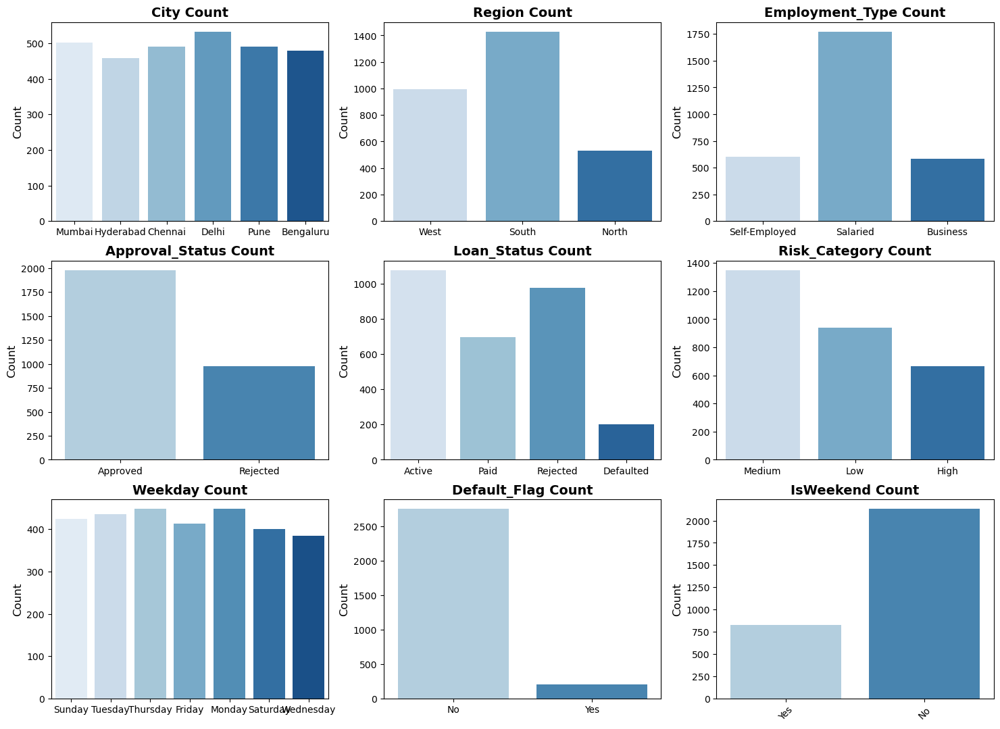

In [50]:
# Displaying countplot for categorical columns

# Create subplots: 3 rows, 3 columns
fig, axes = plt.subplots(3, 3, figsize=(18, 13)) 

# Flatten the 2D array of axes to 1D
axes = axes.flatten()

# Plot each categorical column
for i, col in enumerate(cat_col):
    sns.countplot(data=df, x=col, palette="Blues", ax=axes[i])
    axes[i].set_title(f'{col} Count', fontweight='bold', fontsize=14)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()

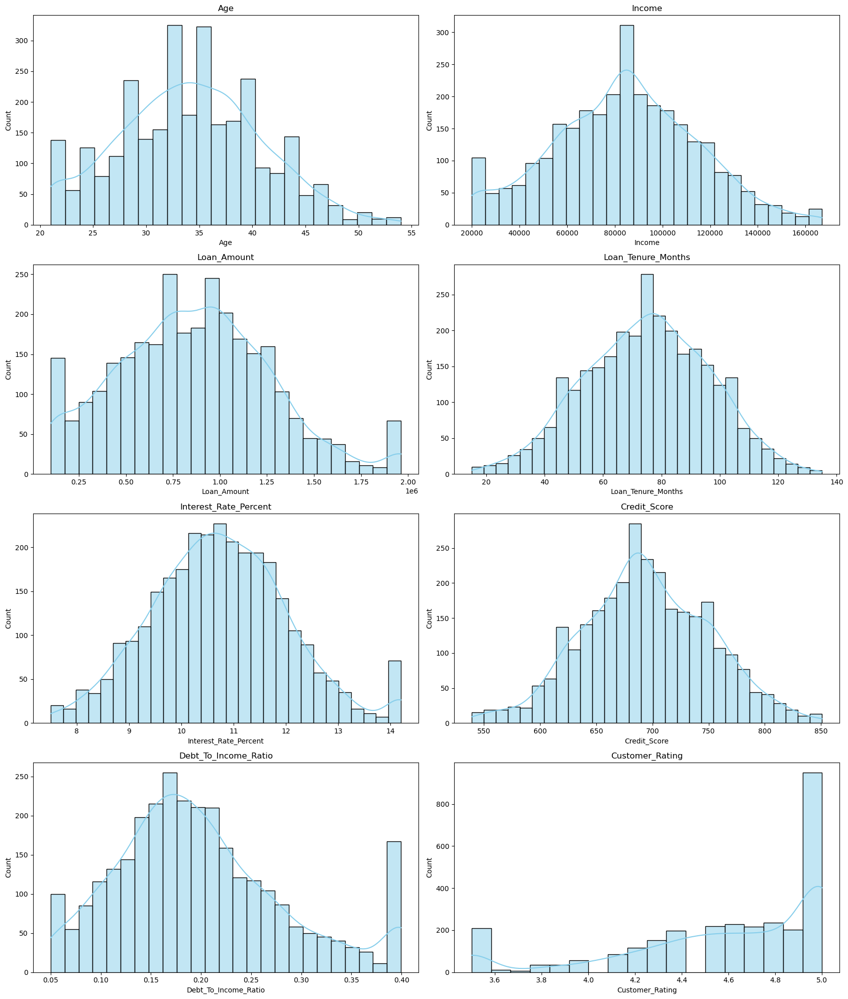

In [51]:
# Plotting histogram to check distribution of numerical columns

fig, axes = plt.subplots(4, 2, figsize=(17, 20))

axes = axes.flatten()
for i, col in enumerate(num_cols):
    sns.histplot(x=df[col], ax=axes[i], color='skyblue', kde=True)
    axes[i].set_title(col)

# Adjusting the layout so that the plots don't overlap with each other
plt.tight_layout()
plt.show()

In [52]:
# crosstab shows how two variables relate to each other

pd.crosstab(df['Default_Flag'], df['Loan_Status'])

Loan_Status,Active,Defaulted,Paid,Rejected
Default_Flag,,,,
No,1077,0,698,978
Yes,0,203,0,0


In [53]:
pd.crosstab(df['Default_Flag'], df['Income_Category'])

Income_Category,Low,Medium,High,Very High
Default_Flag,,,,
No,689,728,640,696
Yes,50,71,39,43


In [54]:
pd.crosstab(df['Default_Flag'], df['Risk_Category'])

Risk_Category,High,Low,Medium
Default_Flag,,,
No,618,907,1228
Yes,49,34,120


In [55]:
df.head()

,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category,Year,Month,Day,Weekday,IsWeekend,Income_Category
0,Mumbai,West,43.0,Self-Employed,90322.0,980052.0,84.0,10.92,672.0,0.1850,Approved,No,Active,4.1,Medium,2023,8,13,Sunday,Yes,High
1,Hyderabad,South,28.0,Salaried,32617.0,488350.0,54.0,9.99,698.0,0.3450,Approved,No,Paid,4.6,Medium,2024,11,26,Tuesday,No,Low
2,Mumbai,West,34.0,Business,86468.0,954165.0,53.0,11.56,709.0,0.3995,Rejected,No,Rejected,4.4,Medium,2024,3,7,Thursday,No,High
3,Mumbai,West,33.0,Self-Employed,110760.0,1298938.0,59.0,8.36,730.0,0.2430,Approved,No,Active,5.0,Low,2023,4,7,Friday,No,Very High
4,Mumbai,West,37.0,Salaried,141338.0,1627058.0,110.0,10.14,767.0,0.1610,Approved,No,Active,4.5,Low,2023,5,30,Tuesday,No,Very High


In [56]:
# Nominal Label encoding for columns having no order

from sklearn.preprocessing import LabelEncoder  # import LabelEncoder from sklearn.preprocessing
le = LabelEncoder()  # initialize label encoder

# List of columns with categorical values
cols = ['City','Region','Employment_Type','Approval_Status','Default_Flag','Loan_Status','Weekday','IsWeekend']

# Apply label encoding to each categorical column
for col in cols:
    df[col] = le.fit_transform(df[col])  # Convert categories to numbers

In [57]:
# Ordinal Label encoding for columns having order

from sklearn.preprocessing import OrdinalEncoder

risk_category = [['Low','Medium','High']]
income_category = [['Low','Medium','High','Very High']]

# Apply Ordinal Encoding to Risk Category column 
encoder = OrdinalEncoder(categories=risk_category)
df['Risk_Category'] = encoder.fit_transform(df[['Risk_Category']])

# Apply Ordinal Encoding to Income Category column 
encoder = OrdinalEncoder(categories=income_category)
df['Income_Category'] = encoder.fit_transform(df[['Income_Category']])

In [58]:
df.head()

,City,Region,Age,Employment_Type,Income,Loan_Amount,Loan_Tenure_Months,Interest_Rate_Percent,Credit_Score,Debt_To_Income_Ratio,Approval_Status,Default_Flag,Loan_Status,Customer_Rating,Risk_Category,Year,Month,Day,Weekday,IsWeekend,Income_Category
0,4,2,43.0,2,90322.0,980052.0,84.0,10.92,672.0,0.1850,0,0,0,4.1,1.0,2023,8,13,3,1,2.0
1,3,1,28.0,1,32617.0,488350.0,54.0,9.99,698.0,0.3450,0,0,2,4.6,1.0,2024,11,26,5,0,0.0
2,4,2,34.0,0,86468.0,954165.0,53.0,11.56,709.0,0.3995,1,0,3,4.4,1.0,2024,3,7,4,0,2.0
3,4,2,33.0,2,110760.0,1298938.0,59.0,8.36,730.0,0.2430,0,0,0,5.0,0.0,2023,4,7,0,0,3.0
4,4,2,37.0,1,141338.0,1627058.0,110.0,10.14,767.0,0.1610,0,0,0,4.5,0.0,2023,5,30,5,0,3.0


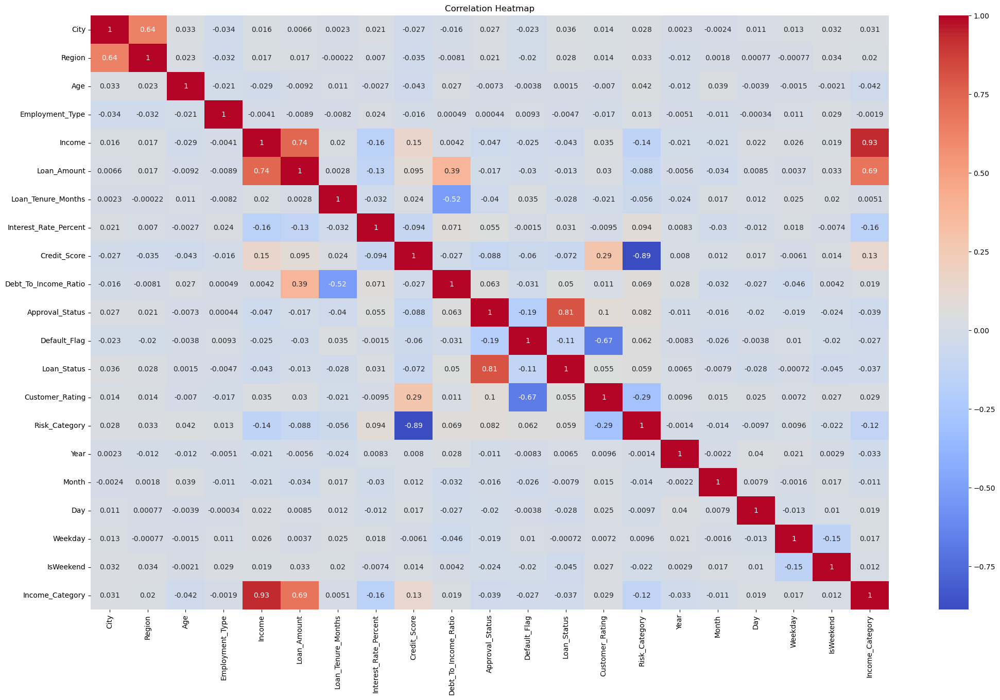

In [59]:
# Displaying correlation heatmap 

cols = df.columns
plt.figure(figsize=(25, 15))
sns.heatmap(df[cols].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [60]:
# Highly class imbalance in target column Default_Flag
# Here we are using oversampling which means generating synthetic records of minority class 

from imblearn.over_sampling import SMOTE
from collections import Counter

# Create SMOTE object
smote = SMOTE(random_state=42)

# Apply SMOTE to features and target
df_resampled, flag_resampled = smote.fit_resample(df.drop('Default_Flag', axis=1), df['Default_Flag'])

# Combine features and target into a new dataframe
df_balanced = pd.concat([df_resampled, flag_resampled], axis=1)

# Check class distribution before and after balancing
print('Before balancing :', Counter(df['Default_Flag']))         
print('After balancing :', Counter(df_balanced['Default_Flag']))

Before balancing : Counter({0: 2753, 1: 203})
After balancing : Counter({0: 2753, 1: 2753})


In [61]:
# Train test split

from sklearn.model_selection import train_test_split
x = df.drop('Default_Flag', axis=1)
y = df['Default_Flag']
X_train, X_test, y_train, y_test = train_test_split(x, y, random_state=42, stratify=y)

Accuracy score : 0.9364005412719891
Classification report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       688
           1       0.62      0.20      0.30        51

    accuracy                           0.94       739
   macro avg       0.78      0.59      0.63       739
weighted avg       0.92      0.94      0.92       739



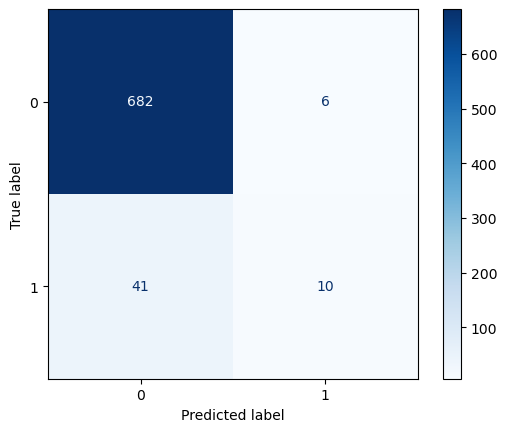

In [116]:
# Logistic Regression

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay,  roc_curve
log_reg = LogisticRegression(max_iter=1000, random_state=42)
log_reg.fit(X_train, y_train)
y_pred = log_reg.predict(X_test)
y_prob = log_reg.predict_proba(X_test)[:,1]
print('Accuracy score :', accuracy_score(y_test, y_pred))
print('Classification report:\n', classification_report(y_test, y_pred))
ConfusionMatrixDisplay.from_estimator(log_reg, X_test, y_test, cmap="Blues")
plt.show()

Accuracy Score: 1.0

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       688
           1       1.00      1.00      1.00        51

    accuracy                           1.00       739
   macro avg       1.00      1.00      1.00       739
weighted avg       1.00      1.00      1.00       739



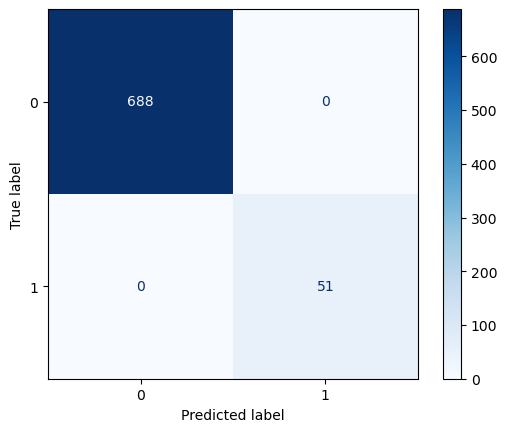

ROC-AUC Score: 1.0


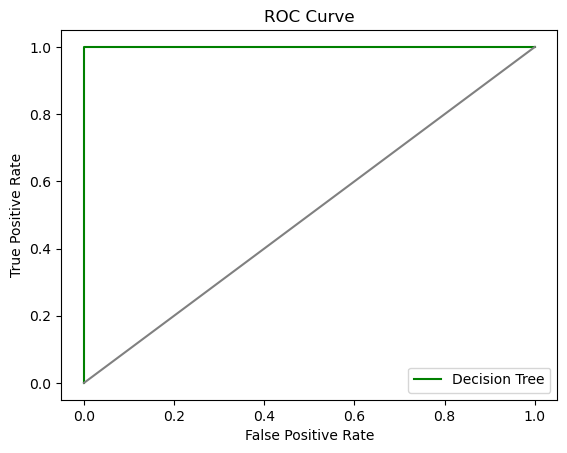

In [118]:
# Decision Tree Classifier

from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier(random_state=42)
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)
y_prob_dt = dt.predict_proba(X_test)[:,1]
print("Accuracy Score:", accuracy_score(y_test, y_pred_dt))
print("\nClassification Report:\n", classification_report(y_test, y_pred_dt))
ConfusionMatrixDisplay.from_estimator(dt, X_test, y_test, cmap="Blues")
plt.show()
print("ROC-AUC Score:", roc_auc_score(y_test, y_prob_dt))
fpr, tpr,_= roc_curve(y_test, y_prob_dt)
plt.plot(fpr, tpr, label="Decision Tree", color="green")
plt.plot([0,1], [0,1], '-', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

Accuracy Score: 1.0

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       688
           1       1.00      1.00      1.00        51

    accuracy                           1.00       739
   macro avg       1.00      1.00      1.00       739
weighted avg       1.00      1.00      1.00       739



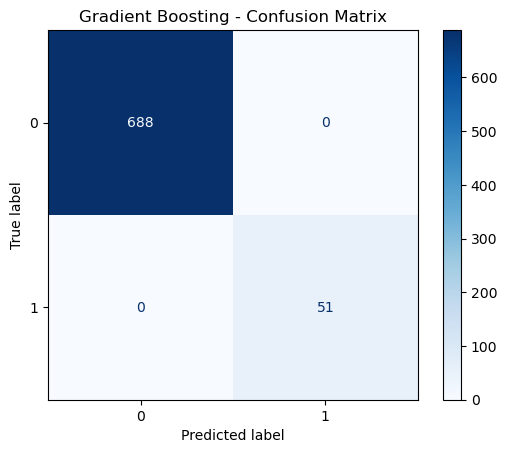

ROC-AUC Score: 1.0


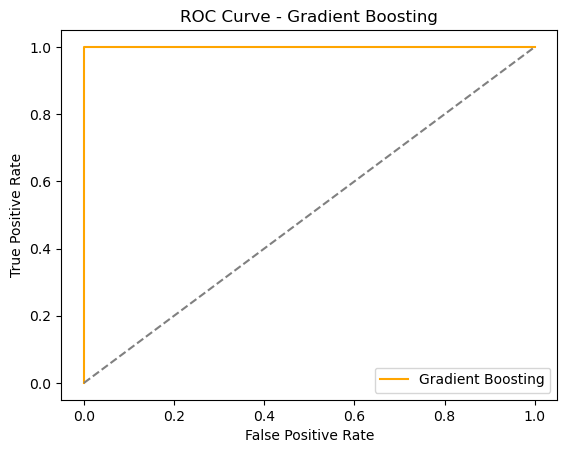

In [120]:
# Gradient Boosting Classifier

from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(random_state=42)
gb.fit(X_train, y_train)
y_pred_gb = gb.predict(X_test)
y_prob_gb = gb.predict_proba(X_test)[:, 1]
print("Accuracy Score:", accuracy_score(y_test, y_pred_gb))
print("\nClassification Report:\n", classification_report(y_test, y_pred_gb))
ConfusionMatrixDisplay.from_estimator(gb, X_test, y_test, cmap="Blues")
plt.title("Gradient Boosting - Confusion Matrix")
plt.show()

print("ROC-AUC Score:", roc_auc_score(y_test, y_prob_gb))
fpr, tpr, _ = roc_curve(y_test, y_prob_gb)
plt.plot(fpr, tpr, label="Gradient Boosting", color="orange")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting")
plt.legend()
plt.show()